In [1]:
import numpy as np
import random
import pandas as pd

from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = (10.0, 8.0)

from sklearn.datasets import make_biclusters
from sklearn.datasets import samples_generator as sg
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn import preprocessing
# from sklearn.cluster.bicluster import SpectralCoclustering
from sklearn.metrics import consensus_score
from sklearn.metrics.cluster import normalized_mutual_info_score
from sklearn.metrics.cluster import adjusted_rand_score
from biclustering import DeltaBiclustering, MSR

In [2]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


`%matplotlib` prevents importing * from pylab and numpy


In [3]:
def generate_dataset(option, noise=1, noise_background=True, shuffle=False):
    shape = (150,150)
    n,m = shape
    
    # values can't be a lot far...
    centers = [20, 40, 60, 80, 100]
    
    y_row = np.zeros(150)
    y_col = np.zeros(150)

    if noise_background:
        data = np.random.rand(n, m)*100
    else:
        data = np.zeros(n*m).reshape(shape)

    if option == 'a':
        data[60:110][:,70:140] = np.random.rand(50,70)*noise + centers[0]
        y_row[60:110] += 1
        y_col[70:140] += 1
    elif option == 'd':
        data[0:50][:,0:70] = np.random.rand(50,70)*noise + centers[0]
        y_row[0:50] += 1
        y_col[0:70] += 1

        data[50:100][:,50:100] = np.random.rand(50,50)*noise + centers[2]
        y_row[50:100] += 2
        y_col[50:100] += 2

        data[100:150][:,80:150] = np.random.rand(50,70)*noise + centers[1]
        y_row[100:150] += 3
        y_col[80:150] += 3
    elif option == 'e':
        data[0:70][:,0:50] = np.random.rand(70,50)*noise + centers[3]
        y_row[0:70] += 1
        y_col[0:50] += 1

        data[50:100][:,50:100] = np.random.rand(50,50)*noise + centers[1]
        y_row[50:100] += 2
        y_col[50:100] += 2

        data[80:150][:,100:150] = np.random.rand(70,50)*noise + centers[2]
        y_row[80:150] += 3
        y_col[100:150] += 3
    elif option == 'f':
        data[0:50][:,0:40] = np.random.rand(50,40)*noise + centers[4]
        y_row[0:50] += 1
        y_col[0:40] += 1

        data[50:150][:,0:40] = np.random.rand(100,40)*noise + centers[0]
        y_row[50:150] += 2

        data[110:150][:,40:95] = np.random.rand(40,55)*noise + centers[2]
        y_row[110:150] += 3
        y_col[40:95] += 2

        data[110:150][:,95:150] = np.random.rand(40,55)*noise + centers[1]
        y_row[110:150] += 3
        y_col[95:150] += 3
    elif option == 'g':
        data[0:110][:,0:40] = np.random.rand(110,40)*noise + centers[0]
        data[110:150][:,0:110] = np.random.rand(40,110)*noise + centers[2]
        data[40:150][:,110:150] = np.random.rand(110,40)*noise + centers[1]
        data[0:40][:,40:150] = np.random.rand(40,110)*noise + centers[3]
    elif option == 'h':
        data[0:90][:,0:90] = np.random.rand(90,90)*noise + centers[0]
        data[35:55][:,35:55] = (np.random.rand(20,20)*noise + centers[1]) + data[35:55][:,35:55]
        data[110:140][:,35:90] = np.random.rand(30,55)*noise + centers[4]
        data[0:140][:,110:150] = np.random.rand(140,40)*noise + centers[2]
        data[0:55][:,130:150] = (np.random.rand(55,20)*noise + centers[3]) + data[0:55][:,130:150]
    elif option == 'i':
        data[20:70][:,20:70] = np.random.rand(50,50)*noise + centers[0]
        data[20:70][:,100:150] = np.random.rand(50,50)*noise + centers[1]
        data[50:110][:,50:120] = np.random.rand(60,70)*noise + centers[2]
        data[120:150][:,20:100] = np.random.rand(30,80)*noise + centers[3]

    if shuffle:
        np.random.shuffle(data)
        np.random.shuffle(data.T)

    return data, y_row, y_col

In [4]:
def onmtf(X, U, S, V):
    U = U * ((X.dot(V).dot(S.T)) / (U.dot(S).dot(V.T).dot(X.T).dot(U)))
    S = S * ((U.T.dot(X).dot(V)) / (U.T.dot(U).dot(S).dot(V.T).dot(V)))
    V = V * ((X.T.dot(U).dot(S)) / (V.dot(S.T).dot(U.T).dot(X).dot(V)))
    return U, S, V

def onm3f(X, U, S, V):
     U = U * (X.dot(V).dot(S.T)) / np.sqrt(U.dot(U.T).dot(X).dot(V).dot(S.T))
     V = V * (X.T.dot(U).dot(S)) / np.sqrt(V.dot(V.T).dot(X.T).dot(U).dot(S))
     S = S * (U.T.dot(X).dot(V)) / np.sqrt(U.T.dot(U).dot(S).dot(V.T).dot(V))
     return U, S, V

def nbvd(X, U, S, V):
     U = U * (X.dot(V).dot(S.T)) / U.dot(U.T).dot(X).dot(V).dot(S.T)
     V = V * (X.T.dot(U).dot(S)) / V.dot(V.T).dot(X.T).dot(U).dot(S)
     S = S * (U.T.dot(X).dot(V)) / U.T.dot(U).dot(S).dot(V.T).dot(V)
     return U, S, V
    
def matrix_factorization_clustering(X, k, l, factorization_func=onmtf, norm=False):
    m, n = X.shape
    U = np.random.rand(m,k)
    S = np.random.rand(k,l)
    V = np.random.rand(n,l)

    if norm:
        X = preprocessing.normalize(X)

    for i in xrange(100):
        U, S, V = factorization_func(X, U, S, V)

    Du = np.diag(np.ones(m).dot(U))
    Dv = np.diag(np.ones(n).dot(V))

    U = U.dot( np.diag(S.dot(Dv).dot(np.ones(l))) )
    V = V.dot( np.diag(np.ones(k).dot(Du).dot(S)) )

    rows_ind = np.argmax(U, axis=1)
    cols_ind = np.argmax(V, axis=1)

    return U, S, V, rows_ind, cols_ind

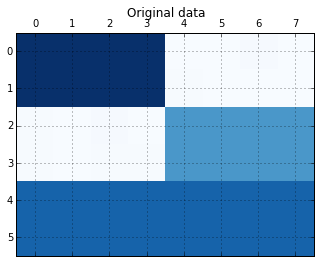

In [5]:
# m, n = (40, 35)
# X = .01 * np.random.rand(m,n)
# X[0:10][:, 0:10] = 1 + .01 * np.random.random()
# X[30:40][:, 20:35] = 1 + .01 * np.random.random()
# X[20:30][:, 20:35] = .6 + .01 * np.random.random()
# X[30:40][:, 36:40] = 1 + .01 * np.random.random()

m, n = (6, 8)
X = .01 * np.random.rand(m,n)
X[0:2][:, 0:4] = 1 + .01 * np.random.random()
X[2:4][:, 4:8] = .6 + .01 * np.random.random()
X[4:6][:, 0:8] = .8 + .01 * np.random.random()

plt.matshow(X, cmap=plt.cm.Blues)
plt.title('Original data')
plt.grid()
plt.show()

In [7]:
U, S, V, rows_ind, cols_ind = matrix_factorization_clustering(X, 3, 2, onmtf)

def plot_factorization_result(U, S, V):
    fig = plt.figure()
    
    ax = fig.add_subplot(2, 2, 1)
    ax.matshow(U.dot(S).dot(V.T), cmap=plt.cm.Blues)
    ax.set_title('reconstruction')
    ax.grid()
    
    ax2 = fig.add_subplot(2, 2, 2)
    ax2.matshow(U, cmap=plt.cm.Blues)
    ax2.set_title('U*S')
    ax2.grid()

    ax3 = fig.add_subplot(2, 2, 3)
    ax3.matshow(S, cmap=plt.cm.Blues)
    ax3.set_title('S')
    ax3.grid()

    ax4 = fig.add_subplot(2, 2, 4)
    ax4.matshow(V.T, cmap=plt.cm.Blues)
    ax4.set_title('S*V\'')
    ax4.grid()
    
    plt.show()


def scores(labels_true, labels_pred, row=True):
    if row:
        print 'Rows scores'
    else:
        print 'Cols scores'
    print 'Random score: %s' % adjusted_rand_score(labels_true, labels_pred)
    print 'Normalized mutual information score: %s' % normalized_mutual_info_score(labels_true, labels_pred)
    print ''

# plot_factorization_result(U, S, V)
# scores(rows_ind, [0, 0, 1, 1, 2, 2])
# scores(cols_ind, [0, 0, 0, 0, 1, 1, 1, 1], row=False)

In [55]:
rows_ind

array([0, 0, 1, 1, 2, 2])

In [56]:
cols_ind

array([0, 0, 0, 0, 1, 1, 1, 1])

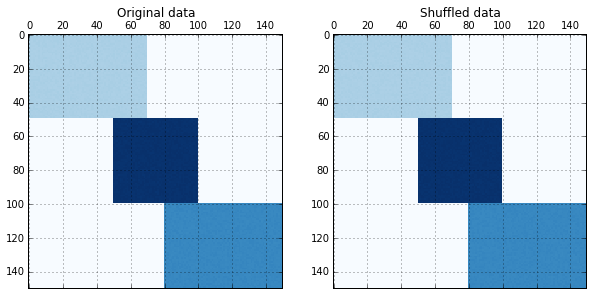

In [58]:
X, x_labels, y_labels = generate_dataset('d', noise_background=False, shuffle=False)
temp, _, _ = generate_dataset('d', noise_background=False)

fig = plt.figure()
    
ax1 = fig.add_subplot(1, 2, 1)
ax1.matshow(temp, cmap=plt.cm.Blues)
ax1.set_title('Original data')
ax1.grid()

ax2 = fig.add_subplot(1, 2, 2)
ax2.matshow(X, cmap=plt.cm.Blues)
ax2.set_title('Shuffled data')
ax2.grid()

plt.show()

In [6]:
U, S, V, rows_ind, cols_ind = matrix_factorization_clustering(X, 3, 3, onmtf, True)
plot_factorization_result(U, S, V)
scores(rows_ind, x_labels)
scores(cols_ind, y_labels, row=False)

NameError: name 'plot_factorization_result' is not defined

In [60]:
rows_ind

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [61]:
cols_ind

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [8]:
twenty_train = fetch_20newsgroups(subset='train',
                                  remove=('headers', 'footers', 'quotes'),
                                  categories=['alt.atheism', 'talk.religion.misc', 'comp.graphics', 'sci.space'])
twenty_test  = fetch_20newsgroups(subset='test',
                                  remove=('headers', 'footers', 'quotes'),
                                  categories=['alt.atheism', 'talk.religion.misc', 'comp.graphics', 'sci.space'])
train_labels = twenty_train.target
test_labels  = twenty_test.target

In [9]:
twenty_train.keys()

['DESCR', 'data', 'target', 'target_names', 'filenames']

In [10]:
len(twenty_train.data)

2034

In [12]:
for i in twenty_train.data:
    print i
    print ''

Hi,

I've noticed that if you only save a model (with all your mapping planes
positioned carefully) to a .3DS file that when you reload it after restarting
3DS, they are given a default position and orientation.  But if you save
to a .PRJ file their positions/orientation are preserved.  Does anyone
know why this information is not stored in the .3DS file?  Nothing is
explicitly said in the manual about saving texture rules in the .PRJ file. 
I'd like to be able to read the texture rule information, does anyone have 
the format for the .PRJ file?

Is the .CEL file format available from somewhere?

Rych



Seems to be, barring evidence to the contrary, that Koresh was simply
another deranged fanatic who thought it neccessary to take a whole bunch of
folks with him, children and all, to satisfy his delusional mania. Jim
Jones, circa 1993.


Nope - fruitcakes like Koresh have been demonstrating such evil corruption
for centuries.


 >In article <1993Apr19.020359.26996@sq.sq.com>, msb@sq.sq

In [13]:
categories = twenty_train['target_names']
print categories
print len(categories)

['alt.atheism', 'comp.graphics', 'comp.os.ms-windows.misc', 'comp.sys.ibm.pc.hardware', 'comp.sys.mac.hardware', 'comp.windows.x', 'misc.forsale', 'rec.autos', 'rec.motorcycles', 'rec.sport.baseball', 'rec.sport.hockey', 'sci.crypt', 'sci.electronics', 'sci.med', 'sci.space', 'soc.religion.christian', 'talk.politics.guns', 'talk.politics.mideast', 'talk.politics.misc', 'talk.religion.misc']
20


In [14]:
def preprocess(data):
    counts_obj = CountVectorizer(stop_words='english')
    counts = counts_obj.fit_transform(data)
    return TfidfTransformer(norm=u'l2').fit_transform(counts), counts_obj.get_feature_names()

X_train, train_features = preprocess(twenty_train.data)
# X_test, test_features   = preprocess(twenty_test.data)

In [15]:
print train_features
print len(train_features)

[u'00', u'000', u'0000', u'00000', u'000000', u'000005102000', u'000062david42', u'0001', u'000100255pixel', u'00041032', u'0004136', u'0004246', u'0004422', u'00044513', u'0004847546', u'0005', u'0007', u'00090711', u'000usd', u'0012', u'001200201pixel', u'0018', u'00196', u'0020', u'0022', u'0028', u'0029', u'0033', u'0034', u'0038', u'0049', u'006', u'0065', u'0094', u'0098', u'00index', u'00pm', u'01', u'0100', u'013846', u'01752', u'0179', u'01821', u'01826', u'0184', u'01852', u'01854', u'01890', u'018b', u'0195', u'0199', u'01a', u'02', u'020', u'0200', u'020359', u'020637', u'02115', u'02138', u'02139', u'02154', u'02178', u'0223', u'0235', u'023b', u'0245', u'03', u'030', u'0300', u'03051', u'0330', u'034', u'034101', u'04', u'040', u'040286', u'0410', u'04110', u'041493003715', u'0418', u'045', u'04g', u'05', u'050', u'0500', u'050524', u'0511', u'05402', u'05446', u'0545', u'054589e', u'058', u'06', u'060', u'0605', u'06111', u'06179397', u'06487', u'0649', u'067', u'0674', 

In [16]:
pd.DataFrame(X_train.todense(), columns=train_features)

,00,000,0000,00000,000000,000005102000,000062david42,0001,000100255pixel,00041032,...,zurich,zurvanism,zus,zvi,zwaartepunten,zwak,zwakke,zware,zwarte,zyxel
0,0.00000,0.000000,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0.00000,0.000000,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0.00000,0.000000,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0.00000,0.000000,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0.00000,0.000000,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0.00000,0.000000,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0.00000,0.000000,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0.00000,0.000000,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0.00000,0.000000,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0.00000,0.000000,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
U, S, V, rows_ind, cols_ind = matrix_factorization_clustering(X_train.toarray(), 4, 6, onmtf, False)

In [ ]:
plot_factorization_result(U, S, V)
scores(rows_ind, train_labels)

In [74]:
rows_ind

array([ 3, 10, 16, ..., 10, 10, 10])

In [100]:
cols_ind

array([ 7, 18,  7, ...,  7, 18, 18])

In [87]:
# Analyzing 10th document cluster
S[10]

array([  4.64715008e-02,   1.28134147e-01,   5.06081732e-01,
         2.36245733e-02,   3.44859010e-02,   5.65105676e-05,
         2.10443491e-01,   1.80708992e+00,   2.18276615e-02,
         1.16503689e-02,   7.81052859e-12,   3.50620996e-01,
         4.07290061e-02,   3.55130112e-03,   1.30333571e-02,
         2.57452760e-02,   1.42856910e-01,   5.90934583e-01,
         4.33626807e+00,   1.84944655e-02,   3.41654754e-02,
         4.47392043e-02,   8.29013189e-03,   1.51092665e-02,
         3.73619878e-02])

In [99]:
# docs of the 10th document cluster
for i in np.where(rows_ind == 10)[0]:
    print 'LABEL: %s' % categories[train_labels[i]].upper()
    print twenty_train['data'][i]
    print ''

LABEL: COMP.SYS.MAC.HARDWARE
From: gnelson@pion.rutgers.edu (Gregory Nelson)
Subject: Thanks Apple: Free Ethernet on my C610!
Article-I.D.: pion.Apr.6.12.05.34.1993.11732
Organization: Rutgers Univ., New Brunswick, N.J.
Lines: 26


	Well, I just got my Centris 610 yesterday.  It took just over two 
weeks from placing the order.  The dealer (Rutgers computer store) 
appologized because Apple made a substitution on my order.  I ordered
the one without ethernet, but they substituted one _with_ ethernet.
He wanted to know if that would be "alright with me"!!!  They must
be backlogged on Centri w/out ethernet so they're just shipping them
with!  

	Anyway, I'm very happy with the 610 with a few exceptions.  
Being nosy, I decided to open it up _before_ powering it on for the first
time.  The SCSI cable to the hard drive was only partially connected
(must have come loose in shipping).  No big deal, but I would have been
pissed if I tried to boot it and it wouldn't come up!
	The hard drive al

In [106]:
# get terms clusters that contributed to the 10th document cluster
terms_clust_contrib_10 = np.where(S[10] > 1.0)[0]
terms_clust_contrib_10

array([ 7, 18])

In [109]:
# how terms clusters 7th and 8th contributed to the 10th document cluster

print 'Words in 7th cluster'
for i in np.where(cols_ind == 7)[0]:
    print train_features[i]

Words in 7th cluster
00
01
02
04
08
10
100
1000
11
12
15
150
16
17
18
19
1988
1990
1991
1992
1993
1993apr16
1st
20
200
21
22
23
24
25
250
26
27
28
29
2nd
30
300
31
32
33
34
35
36
37
38
39
3rd
40
400
41
42
43
44
45
46
47
48
49
50
500
52
53
54
55
56
57
58
59
60
600
61
64
65
66
70
71
72
75
80
81
85
86
88
89
90
91
92
93
95
99
__
able
account
add
added
additional
advantage
advice
ago
al
alan
allen
angeles
anybody
apparently
appreciate
april
art
atlanta
ball
base
beat
bell
best
bet
better
bigger
bit
bitnet
black
blue
bnr
bob
boston
bought
box
break
brown
btw
built
buy
buying
ca
cable
called
came
center
central
centre
ch
chance
changed
changes
changing
charles
cheap
check
checked
cheers
chicago
chips
circuit
city
class
close
closer
club
comes
comments
commercial
companies
compare
compared
comparison
complete
completely
complex
computer
conference
connected
considering
contact
content
copies
copy
correctly
cost
costs
count
couple
coverage
craig
cross
current
currently
daily
dale
date
dave
davi

In [110]:
print 'Words in 8th cluster'
for i in np.where(cols_ind == 8)[0]:
    print train_features[i]

Words in 8th cluster
virginia
